#### べき乗解析方法論文のFigure作成1

To be submitted to JSA

In [1]:
import time
from datetime import datetime
import re
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import scipy as sp
from scipy.optimize import leastsq
import scipy.optimize as optimize
from scipy.optimize import curve_fit  

import warnings
warnings.simplefilter('ignore')
# warnings.resetwarnings()
# warnings.simplefilter('ignore', FutureWarning)

from pfit import power_fit as powfit
from pfit import sim_func as simf

%load_ext autoreload
%autoreload 2


In [2]:
# plt.rcParams["font.family"] = "DejaVu Serif"
plt.rcParams['font.family'] = 'Arial' #全体のフォントをArialに設定 
plt.rcParams["font.size"] = 15  #全体のフォントサイズを15ptに指定
# plt.rcParams['font.family'] = 'Times New Roman' # font familyの設定
# plt.rcParams["font.weight"] = "bold"
# plt.rcParams['mathtext.fontset'] = 'stix' # math fontの設定
# plt.rcParams['mathtext.fontset'] = 'stixsans' # math fontの設定
# plt.rcParams["mathtext.weight"] = "bold"

plt.rcParams['xtick.direction'] = 'in' # x axis in
plt.rcParams['ytick.direction'] = 'in' # y axis in 
# plt.rcParams['axes.linewidth'] = 1.0 # axis line width
# plt.rcParams['axes.grid'] = True # make grid

# plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.dpi"] = 300


# https://analytics-note.xyz/programming/matplotlib-text-trans-axes/
# # transform=ax.transAxes　を指定すると、図形の枠を基準にした位置にテキストが挿入される
# ax.text(0.01, 0.01, "左下", transform=ax.transAxes)
# ax.text(0.01, 0.99, "左上", verticalalignment='top', transform=ax.transAxes)
# ax.text(0.99, 0.01, "右下", horizontalalignment='right', transform=ax.transAxes)
# ax.text(0.99, 0.99, "右上", va='top', ha='right', transform=ax.transAxes)
# ax.text(0.5, 0.5, "中央", va='center', ha='center', transform=ax.transAxes)
# # 0 ~ 1　の範囲を超えるとグラフの外にテキストを配置できる
# ax.text(0.5, 1.05, "上部枠外", ha='center', transform=ax.transAxes)
# ax.text(1.02, 0.5, "右側枠外", va='center', transform=ax.transAxes, rotation=270)

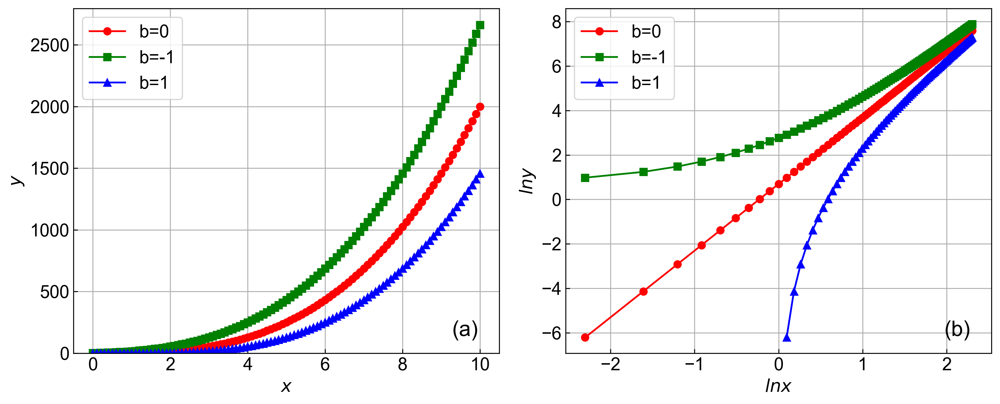

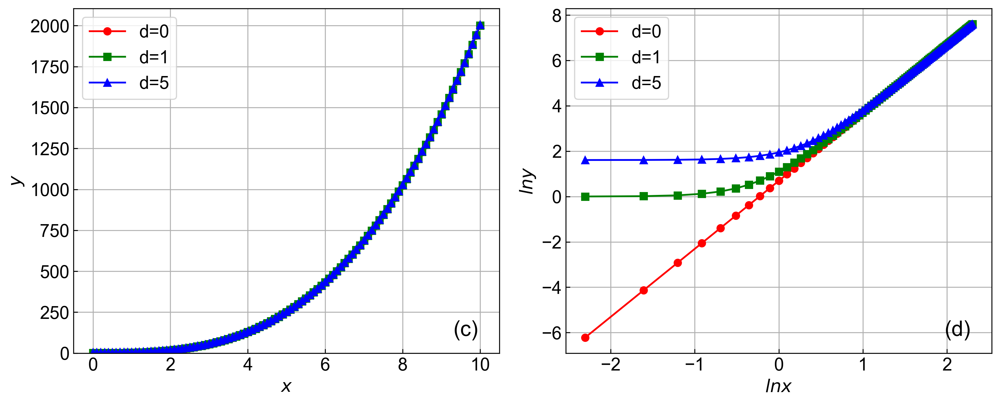

In [3]:
# Shift variation
# xx2 = np.linspace(0,10,100)
xx2 = np.arange(0,10.1,0.1)
para1b=(2,0,3,0)
para2b=(2,-1,3,0)
para3b=(2,1,3,0)
# simf.pw_ln_plot(xx2,para1b,para2b,para3b,
#                 exlim=None,
#                 leg_title='$y=a \cdot (x-b)^c + d$',
#                 axi=None,figsize=(12,5))
simf.pw_ln_plot_v2(xx2,para1b,para2b,para3b,
                  exlim=None,
                  leg_title=None,
                  axi=None,
                  l_ind=1,
                  l_txt='b=',
                  fig_title='Shift (b) dependence',
                  figsize=(12,5),fig_label1='(a)',fig_label2='(b)')                
                
# background variation
para1bc=(2,0,3,0)
para2bc=(2,0,3,1)
para3bc=(2,0,3,5)
# simf.pw_ln_plot(xx2,para1bc,para2bc,para3bc,
#                 exlim=None,
#                 leg_title='$y=a \cdot (x-b)^c + d$',
#                 axi=None,figsize=(12,5))
simf.pw_ln_plot_v2(xx2,para1bc,para2bc,para3bc,
                  exlim=None,
                  leg_title=None,
                  axi=None,
                  l_ind=3,
                  l_txt='d=',
                  fig_title='Background (d) dependence',
                  figsize=(12,5),fig_label1='(c)',fig_label2='(d)')      

#### 1/n Power plot Simulations

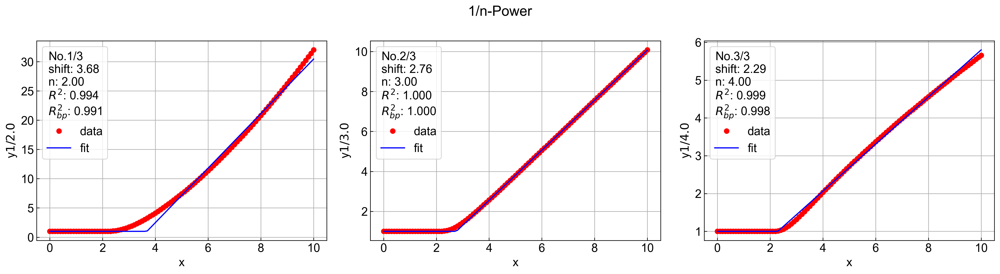

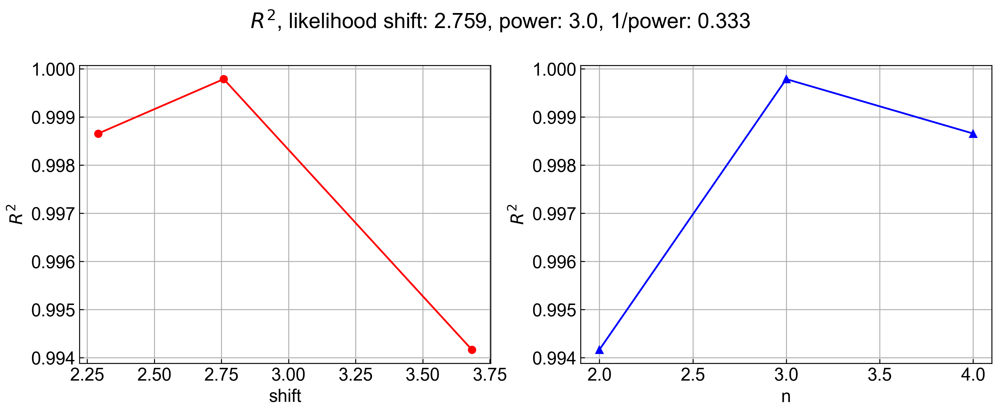

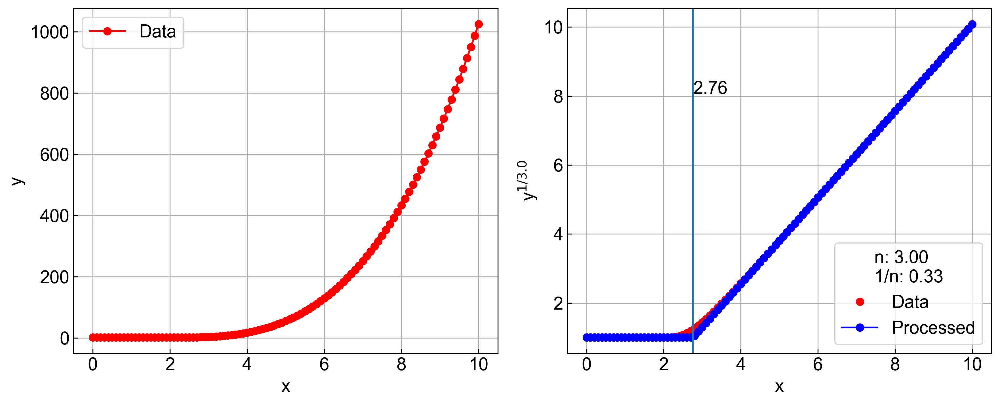

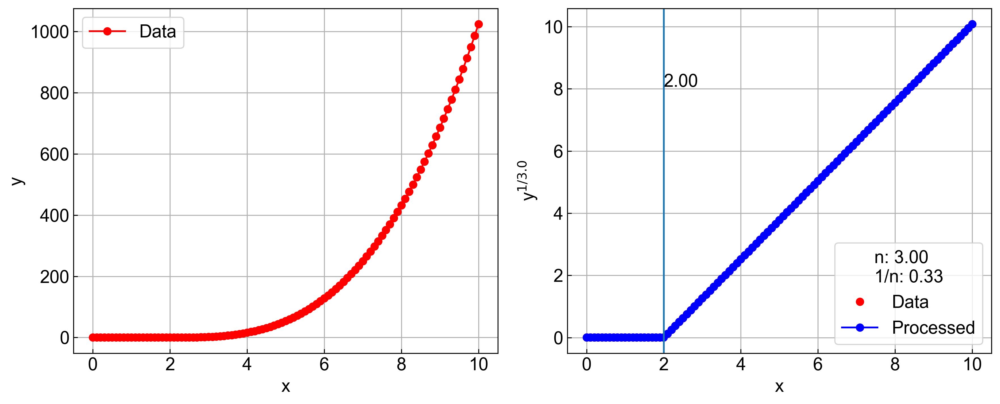

Const Power: shift: 2.76, power: 3.00
popt bg:1.000
bg1:1.000
bg2:1.000


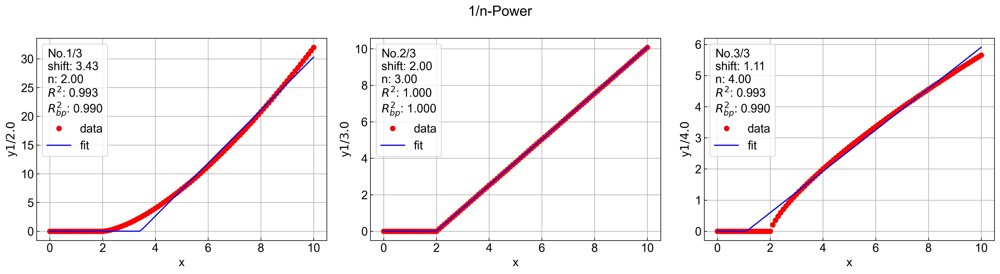

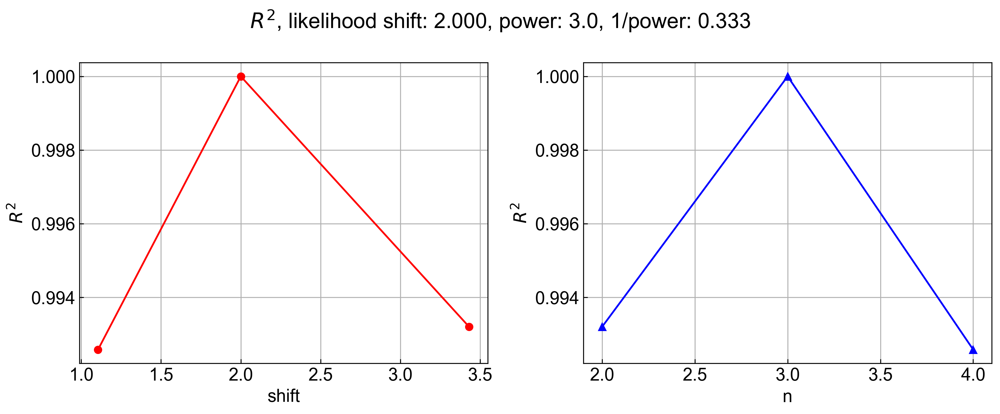

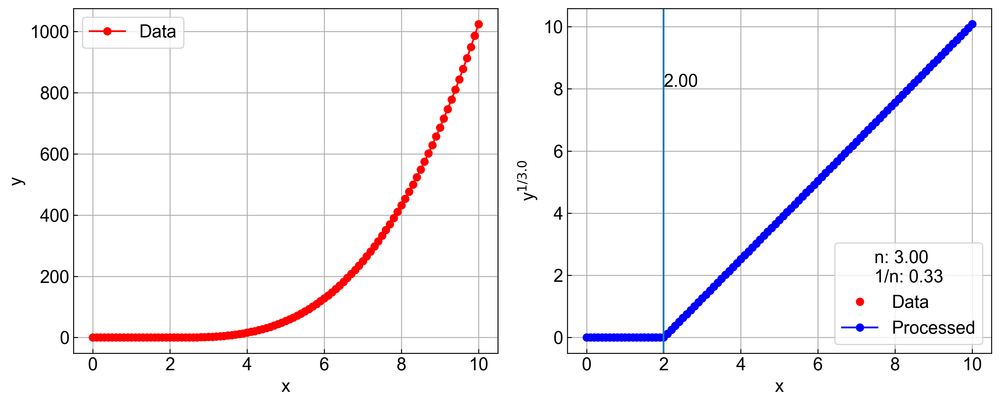

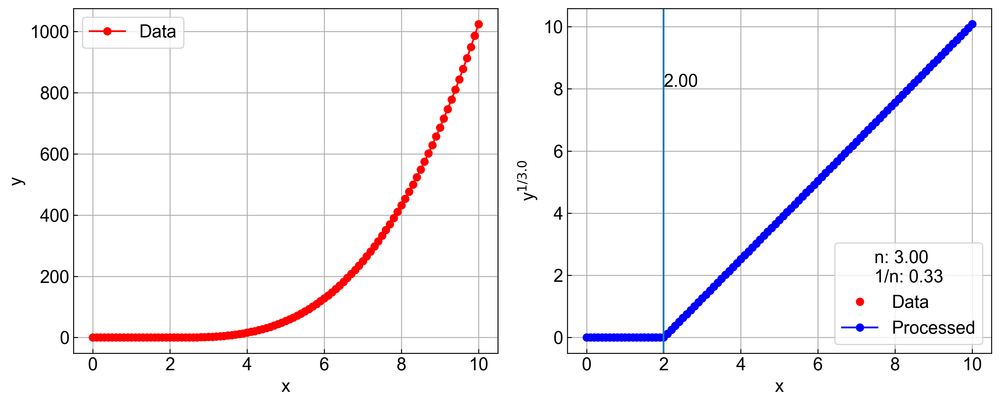

Const Power: shift: 2.00, power: 3.00


In [5]:
# noise なし
xx = np.arange(0,10.1,0.1)
p =  (2,2,3,1)
yy = simf.power_plus(xx,*p) 

# yy = simf.power_plus(xx,*p) + np.random.normal(loc=0.0, scale=1.0, size=len(xx))
# ps = (1,2,1000,10)
# yy = simf.pys(xx,*ps)

# search_range = powfit.create_serach_range(2, 0.5, 0.1)


# for im in [0,0.1,0.3,0.5,1.0,1.5]:
for im in [0,]:
    temp = powfit.PfAnalysis(xx,yy)
    # print('Constant Power')
    temp.ydata = temp.ydata
    temp.shift_estimate_by_power_scan(search_range=[2,3,4],
                                    zero_replace=False,
                                    likely_evaluation='r2',
                                    info=False, 
                                    plot=True)
    
    print(f'Const Power: shift: {temp.shebypw["shift"]:.2f}, power: {temp.shebypw["power"]:.2f}')
    bg1 = np.mean(temp.ydata[:5])
    bg2 = temp.shebypw["popt"][2]**temp.shebypw["power"]
    print(f'popt bg:{temp.shebypw["popt"][2]:.3f}')
    print(f'bg1:{bg1:.3f}')
    print(f'bg2:{bg2:.3f}')
    temp.ydata = temp.ydata - bg1 

    
    temp.shift_estimate_by_power_scan(search_range=[2,3,4],
                                        zero_replace=False,
                                        info=False, 
                                        likely_evaluation='r2',
                                        plot=True)
    
    print(f'Const Power: shift: {temp.shebypw["shift"]:.2f}, power: {temp.shebypw["power"]:.2f}')


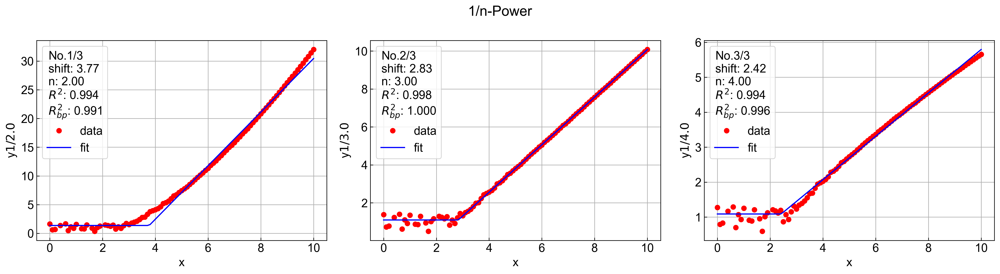

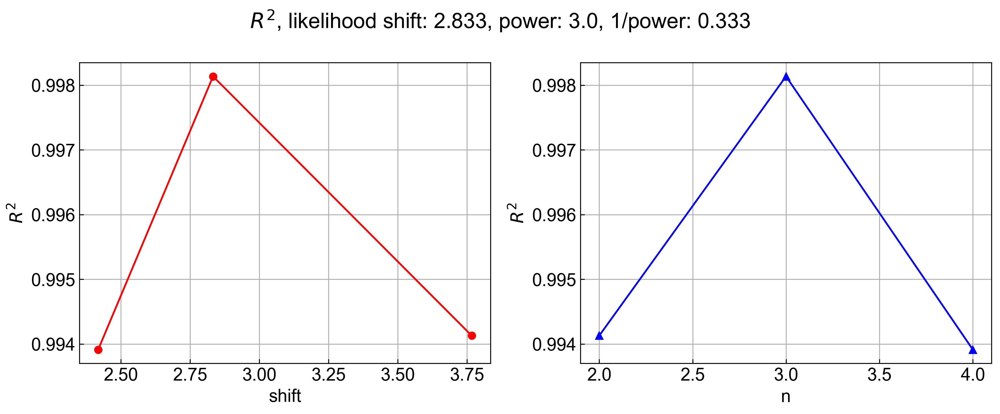

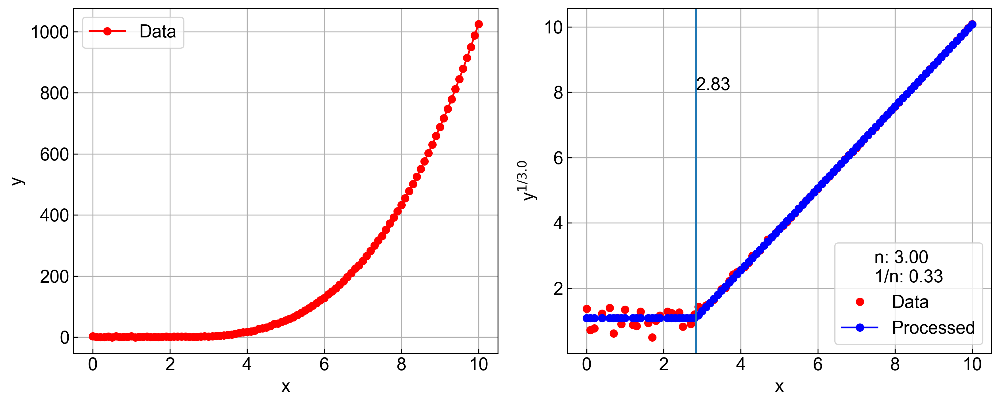

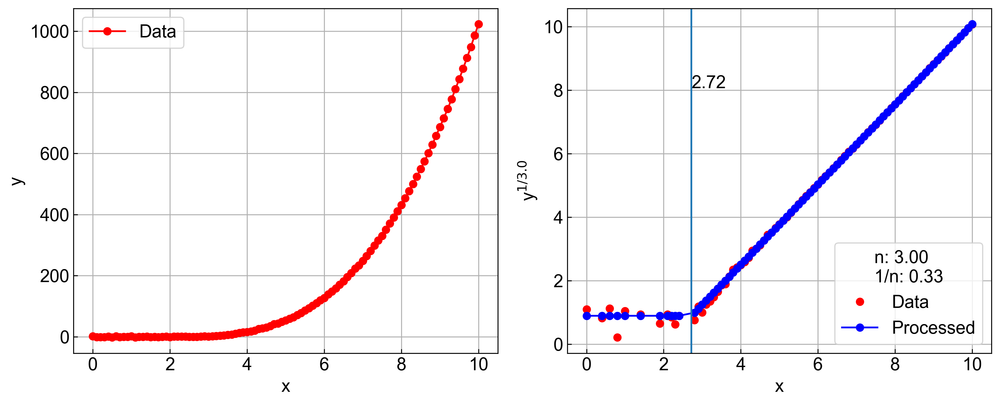

Const Power: shift: 2.83, power: 3.00
popt bg:1.094
mean:0.903
fit:1.310


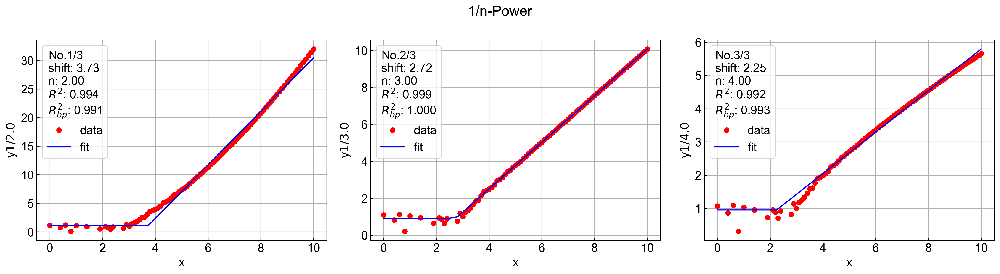

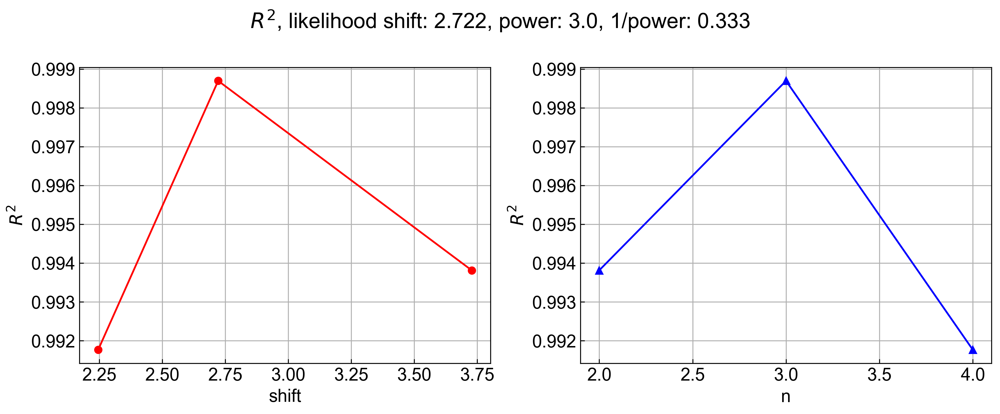

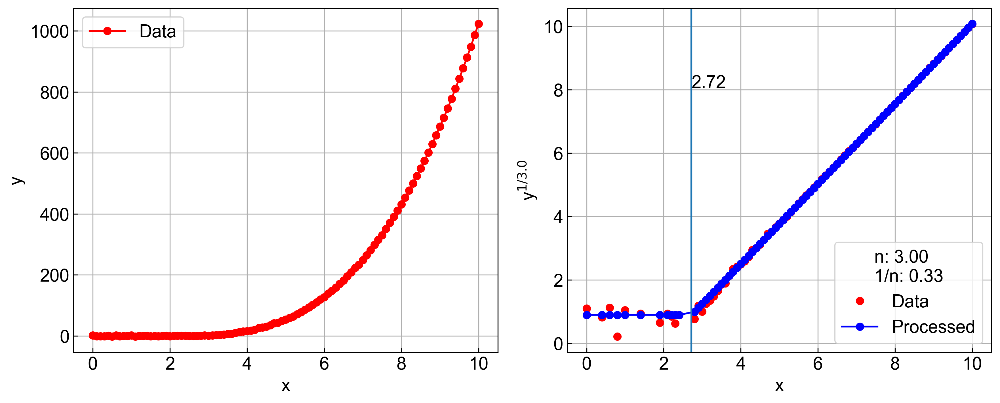

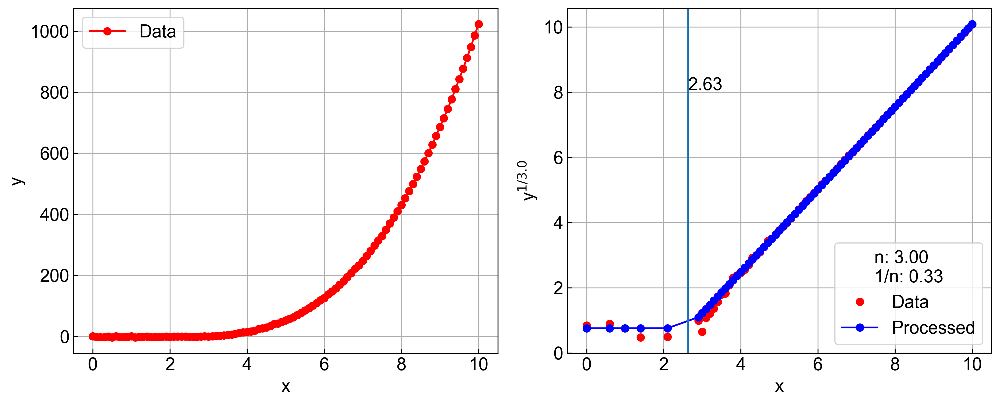

Const Power: shift: 2.72, power: 3.00


In [6]:
# noiseあり
np.random.seed(seed=1)
xx = np.arange(0,10.1,0.1)
p =  (2,2,3,1)
yy = simf.power_plus(xx,*p) + np.random.normal(loc=0.0, scale=1, size=len(xx))

# search_range = powfit.create_serach_range(2, 0.5, 0.1)

# for im in [0,0.1,0.3,0.5,1.0,1.5]:
for im in [0,]:
    temp = powfit.PfAnalysis(xx,yy)
    # print('Constant Power')
    temp.shift_estimate_by_power_scan(search_range=[2,3,4],
                                        zero_replace=False,
                                        # zero_replace=True,
                                        # likely_evaluation='r2_bp',
                                        likely_evaluation='r2',
                                        info=False, 
                                        plot=True)
    
    print(f'Const Power: shift: {temp.shebypw["shift"]:.2f}, power: {temp.shebypw["power"]:.2f}')
    bg1 = np.mean(temp.ydata[:10])
    bg2 = temp.shebypw["popt"][2]**temp.shebypw["power"]
    print(f'popt bg:{temp.shebypw["popt"][2]:.3f}')
    print(f'mean:{bg1:.3f}')
    print(f'fit:{bg2:.3f}')
    temp.ydata = temp.ydata-bg2 # fittingした値でBgを引く
    # temp.ydata = temp.ydata-bg1
    
    temp.shift_estimate_by_power_scan(search_range=[2,3,4],
                                        zero_replace=False,
                                        # zero_replace=True,
                                        # likely_evaluation='r2_bp',
                                        likely_evaluation='r2',
                                        info=False, 
                                        plot=True)
    
    print(f'Const Power: shift: {temp.shebypw["shift"]:.2f}, power: {temp.shebypw["power"]:.2f}')

ratio:0.00, Max:1024.00, Min:0.00


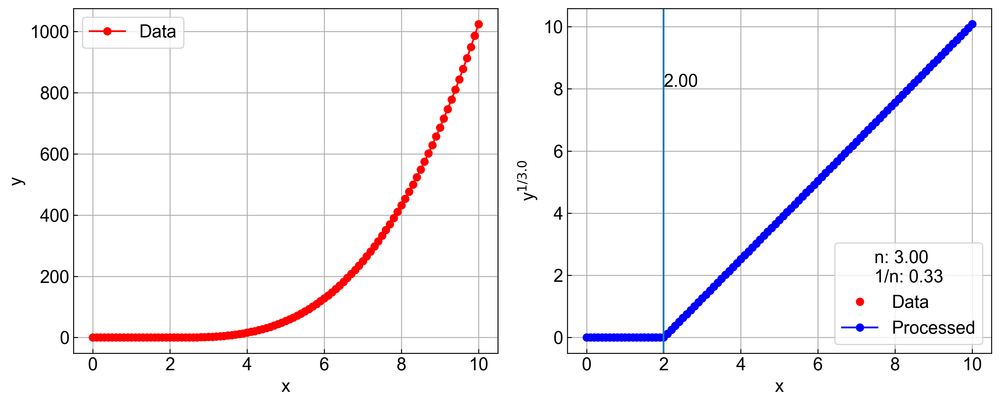

ratio:0.00, Max:1025.00, Min:1.00


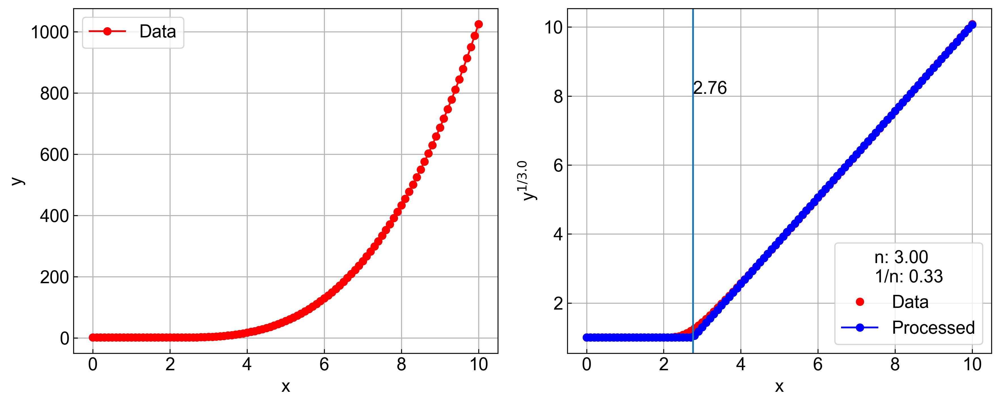

ratio:0.00, Max:1029.00, Min:5.00


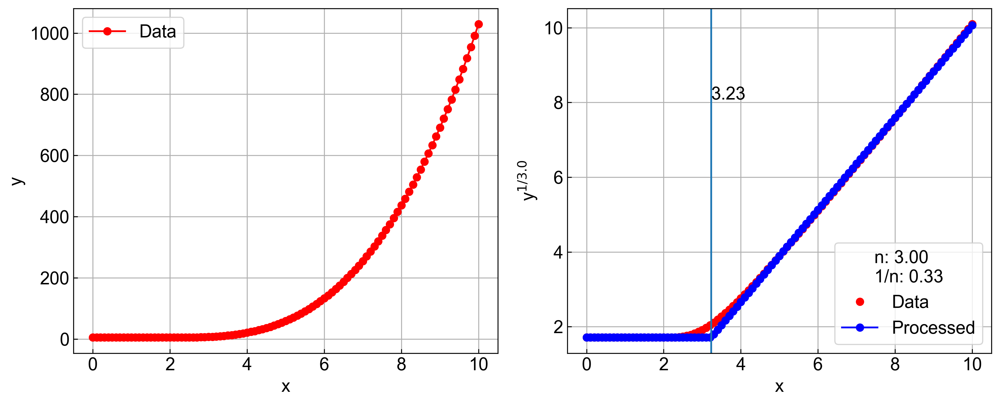

ratio:0.01, Max:1034.00, Min:10.00


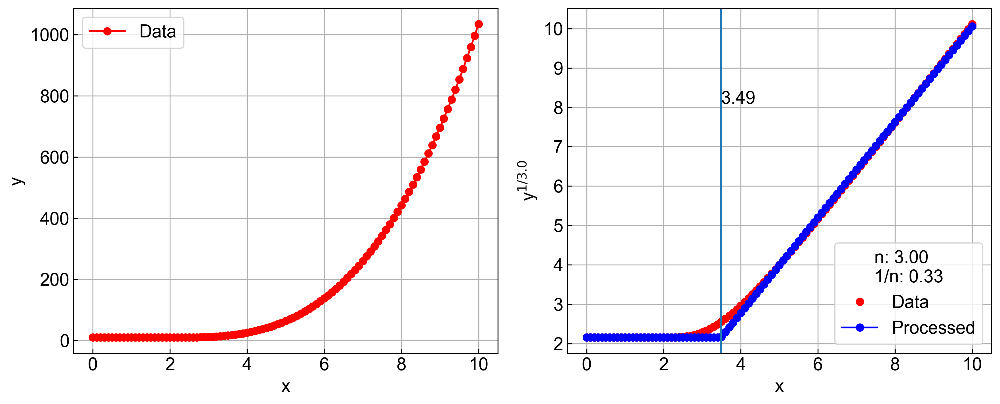

ratio:0.01, Max:1039.00, Min:15.00


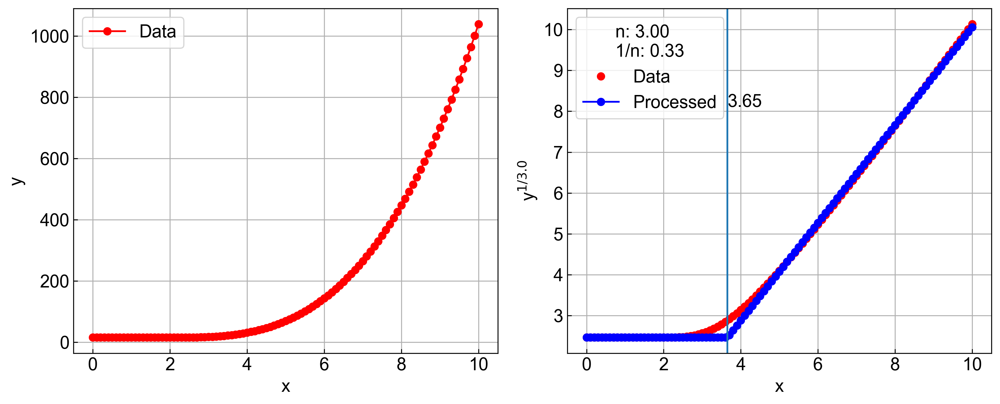

ratio:0.02, Max:1044.00, Min:20.00


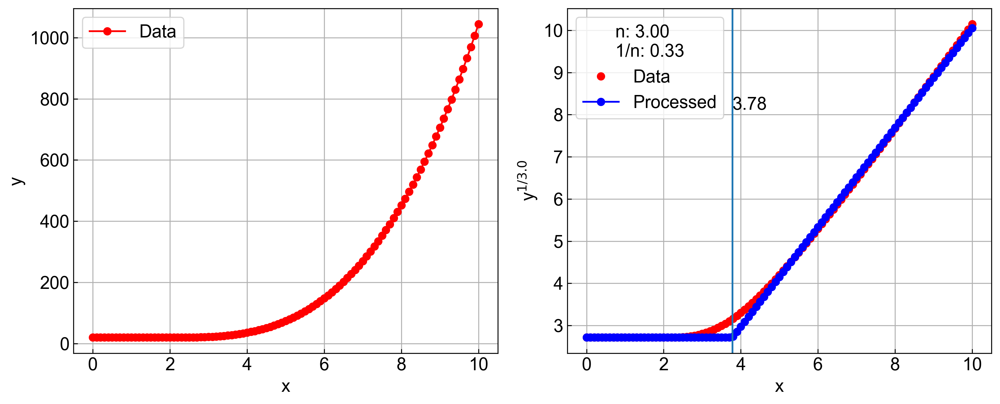

ratio:0.03, Max:1054.00, Min:30.00


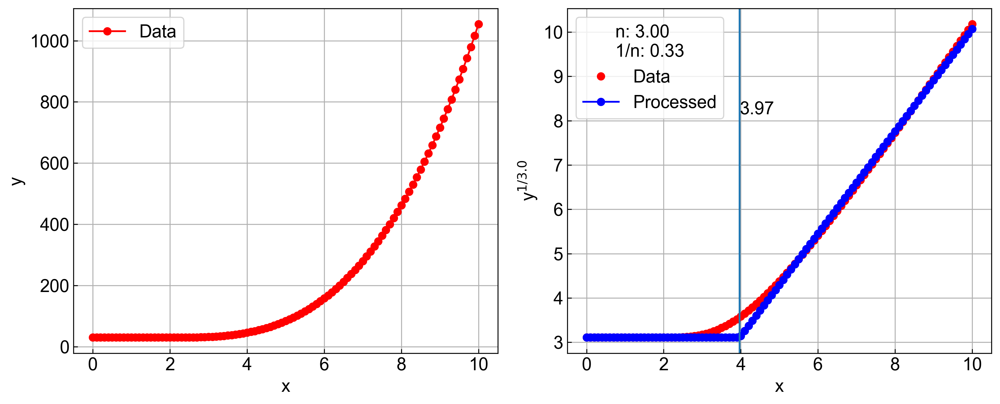

ratio:0.04, Max:1064.00, Min:40.00


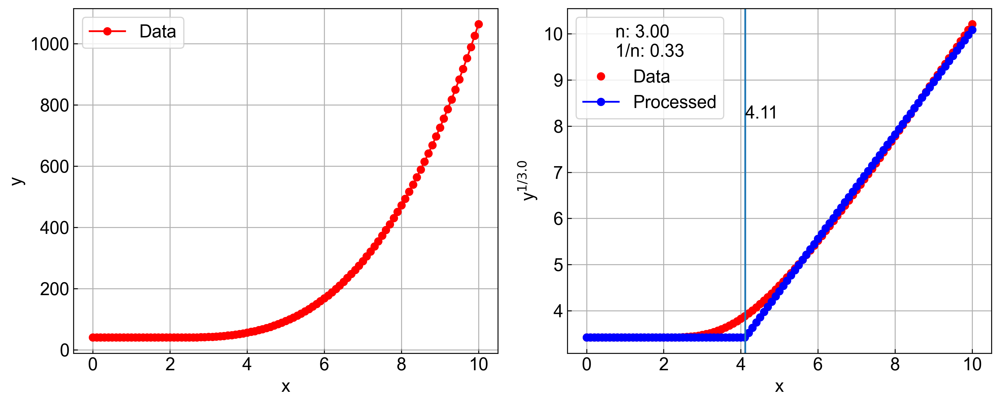

ratio:0.05, Max:1074.00, Min:50.00


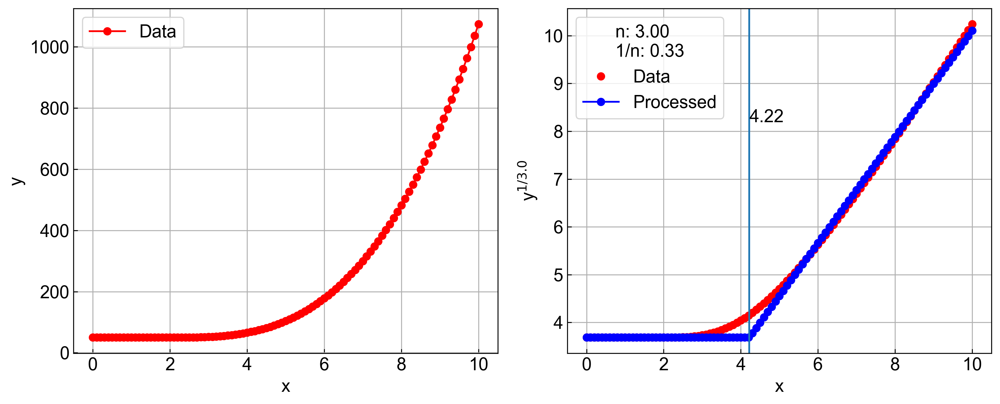

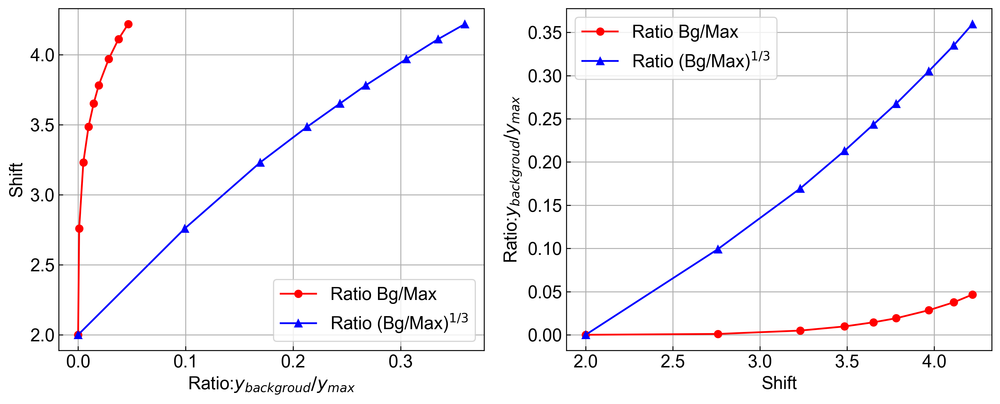

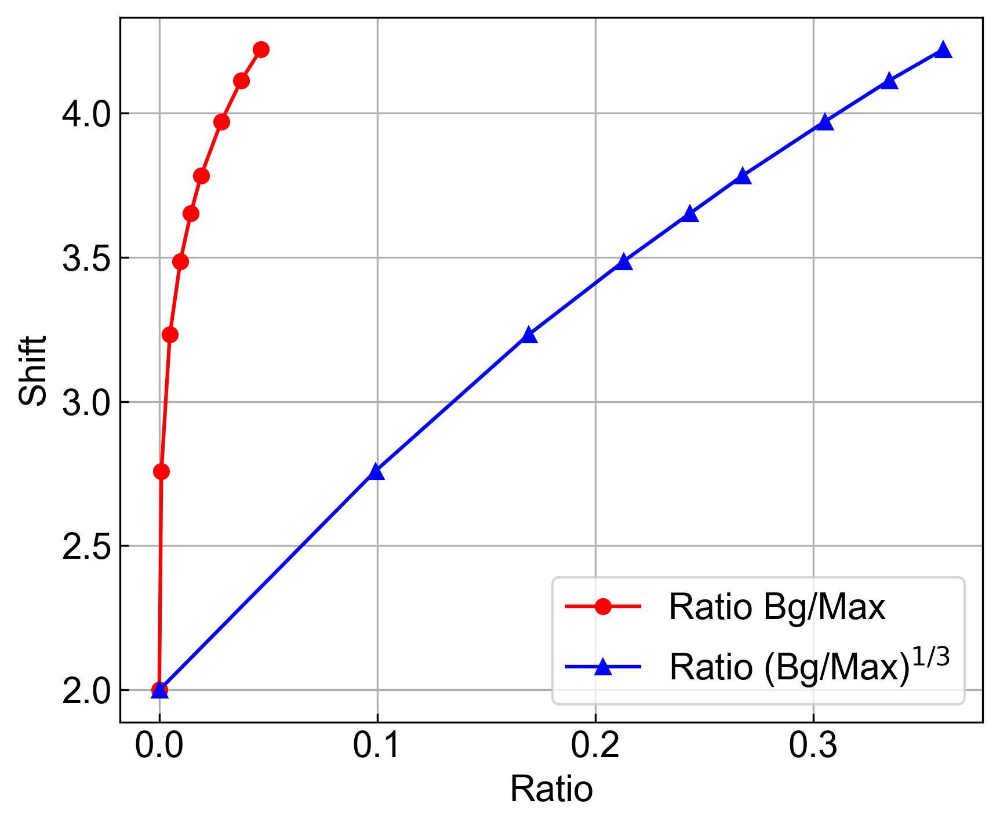

In [7]:
# バックグラウンドの値と閾値との関係

maxs=[]
mins=[]
ips=[]
for i in [0,1,5,10,15,20,30,40,50]:
    pp =(2,2,3,i)
    ytemp= simf.power_plus(xx,*pp) 
    max_= np.max(ytemp)
    min_= np.min(ytemp)
    print(f'ratio:{min_/max_:.2f}, Max:{max_:.2f}, Min:{min_:.2f}')
    res1 = powfit.const_inv_power_fit(xdata=xx, ydata=ytemp, power_num=3, ini_params=None,
                            min_error='mae',
                            retry_r2=0.9, 
                            negative=False, zero_replace=False,
                            plot=True, info=False,)
    maxs.append(np.max(ytemp))
    mins.append(np.min(ytemp))
    ips.append(res1['popt'][1])

fig = plt.figure(figsize=(12,5), tight_layout=True)
ax1 = fig.add_subplot(1,2,1)
ax1.plot(np.array(mins)/np.array(maxs),ips, 'ro-', label='Ratio Bg/Max')
ax1.plot((np.power(np.array(mins),1/3))/(np.power(np.array(maxs),1/3)),ips, 'b^-', label='Ratio (Bg/Max)$^{1/3}$')
ax1.grid()
ax1.set_ylabel('Shift')
ax1.set_xlabel('Ratio:$y_{backgroud} / y_{max}$')
ax1.legend()

ax2 = fig.add_subplot(1,2,2)
ax2.plot(ips, np.array(mins)/np.array(maxs), 'ro-', label='Ratio Bg/Max')
ax2.plot(ips, (np.power(np.array(mins),1/3))/(np.power(np.array(maxs),1/3)), 'b^-', label='Ratio (Bg/Max)$^{1/3}$')
ax2.grid()
ax2.set_xlabel('Shift')
ax2.set_ylabel('Ratio:$y_{backgroud} / y_{max}$')
ax2.legend()
plt.show()

fig1 = plt.figure(figsize=(6,5), tight_layout=True)
ax11 = fig1.add_subplot(1,1,1)
ax11.plot(np.array(mins)/np.array(maxs),ips, 'ro-', label='Ratio Bg/Max')
ax11.plot((np.power(np.array(mins),1/3))/(np.power(np.array(maxs),1/3)),ips, 'b^-', 
          label='Ratio (Bg/Max)$^{1/3}$')
ax11.grid()
ax11.set_ylabel('Shift')
ax11.set_xlabel('Ratio')
ax11.legend()
plt.show()

#### Shitf-Log-Log-Plot

Step:0.1刻み

b'の範囲 1.5から2.5

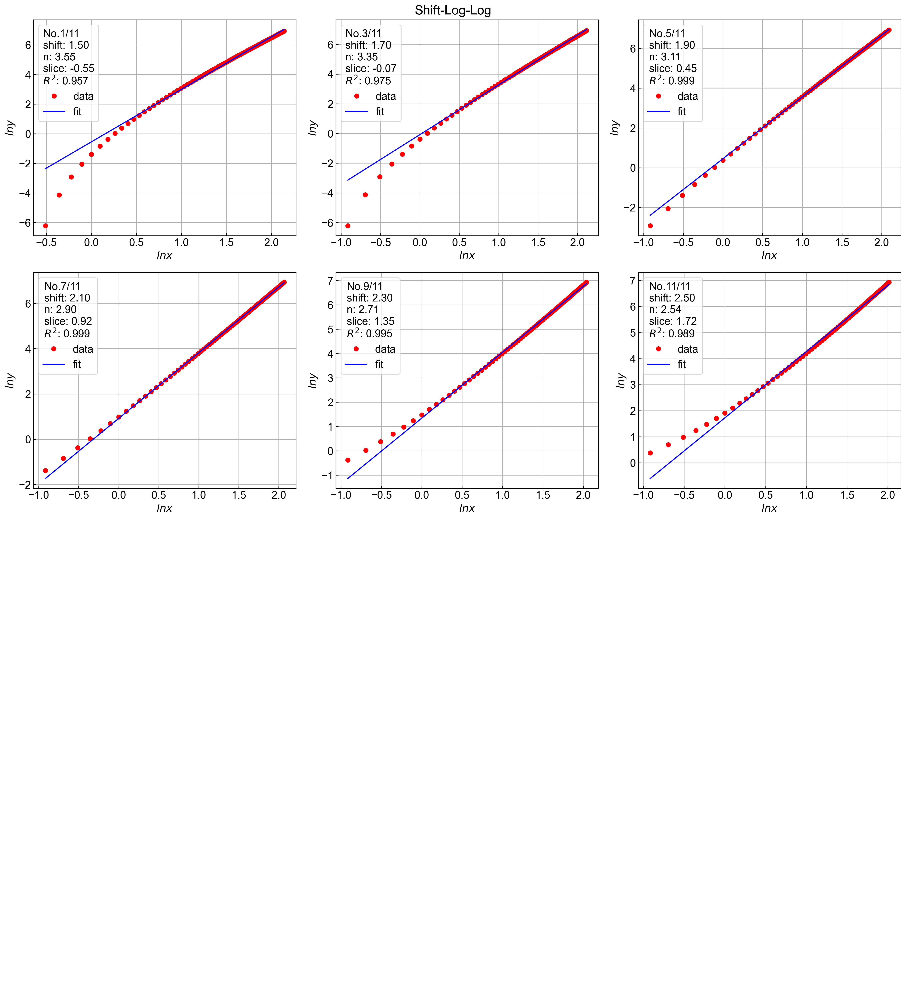

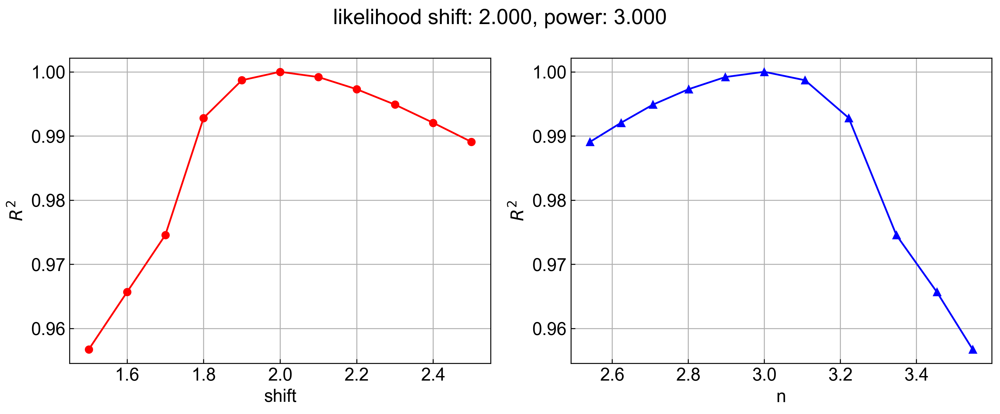

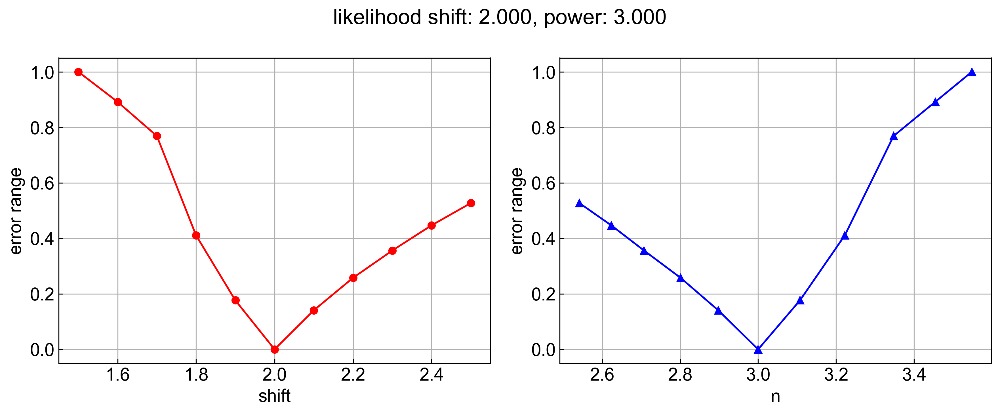

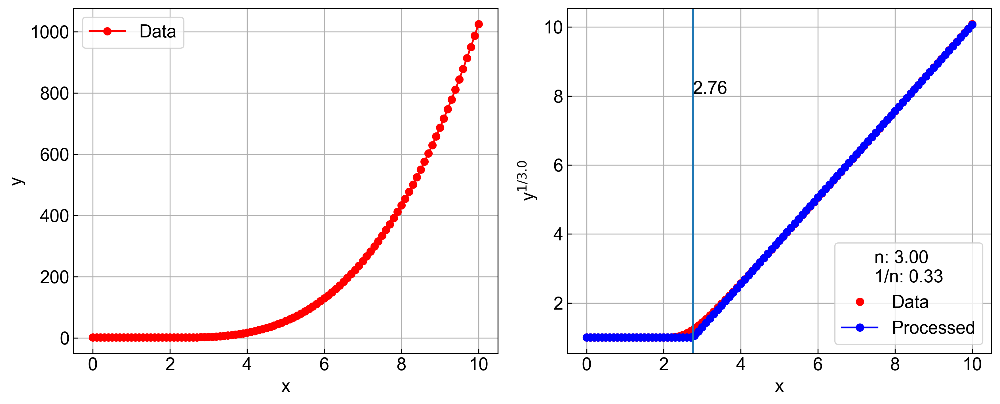

Margin: 0.3, shift: 2.00, power: 3.00
R2: 1.00, ER: 0.00


In [8]:
# ノイズなし
xx = np.arange(0,10.1,0.1)
p =  (2,2,3,1)
yy = simf.power_plus(xx,*p) 


search_range = powfit.create_serach_range(2, 0.5, 0.1)

# for im in [0,0.1,0.3,0.5,1.0,1.5]:
for im in [0.3,]:
    temp = powfit.PfAnalysis(xx,yy)
    # print('Constant Power')
    # temp.shift_estimate_by_power_scan(search_range=None,
    #                                 info=False, 
    #                                 plot=True)
    # print('Constant Shift')
    temp.power_estimate_by_shift_scan(search_range=search_range, 
                                        fit_type='mae', 
                                        # fit_type='weight',
                                        bg_num=6,
                                        lim_val=im,
                                        min_error='mae',
                                        info=False,
                                        plot=True,
                                        plot_fig_step=2)
        
        # print(f'Const Power: shift: {temp.shebypw["shift"]:.2f}, power: {temp.shebypw["power"]:.2f}')
    # print(f'Const Shift: shift: {temp.pwebysh["shift"]:.2f}, power: {temp.pwebysh["power"]:.2f}')
    print(f'Margin: {im}, shift: {temp.pwebysh["shift"]:.2f}, power: {temp.pwebysh["power"]:.2f}')
    print(f'R2: {temp.pwebysh["r2"]:.2f}, ER: {temp.pwebysh["er"]:.2f}')


# 真のｂよりもShiftが小さい値の時には、データはFitting Lineに対して下にずれる。そしてLogの性質からちょっとのずれでマイナスに大きく振れる。


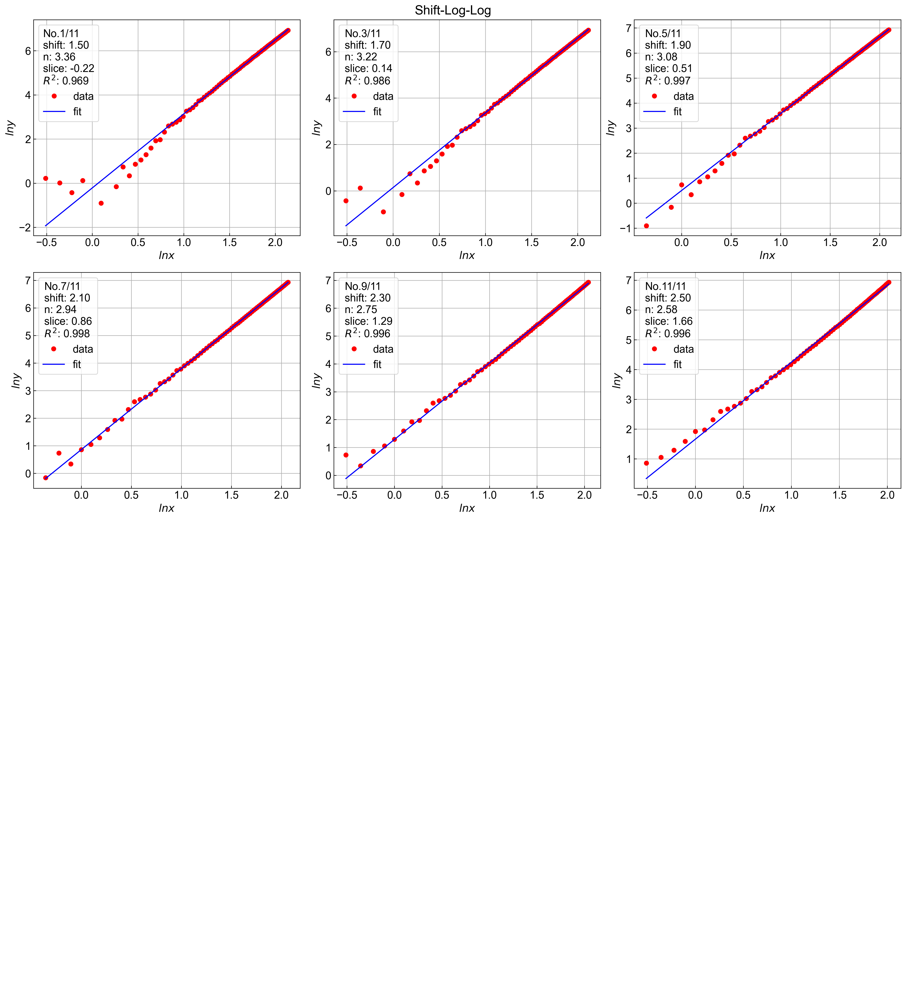

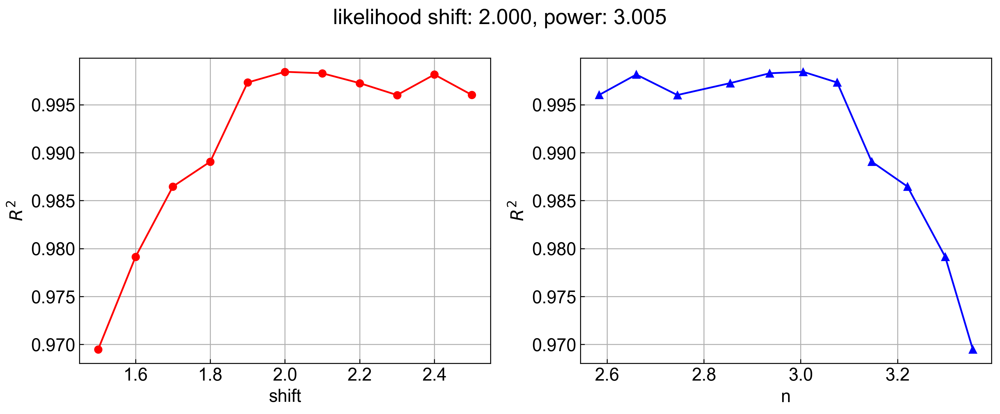

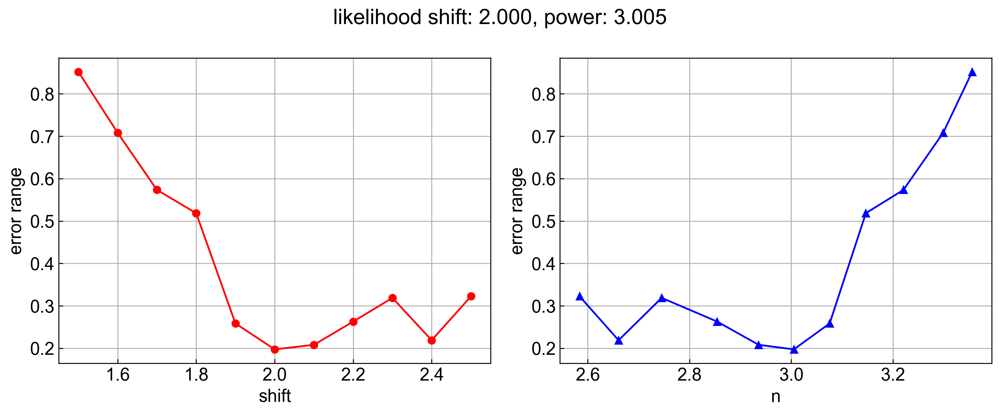

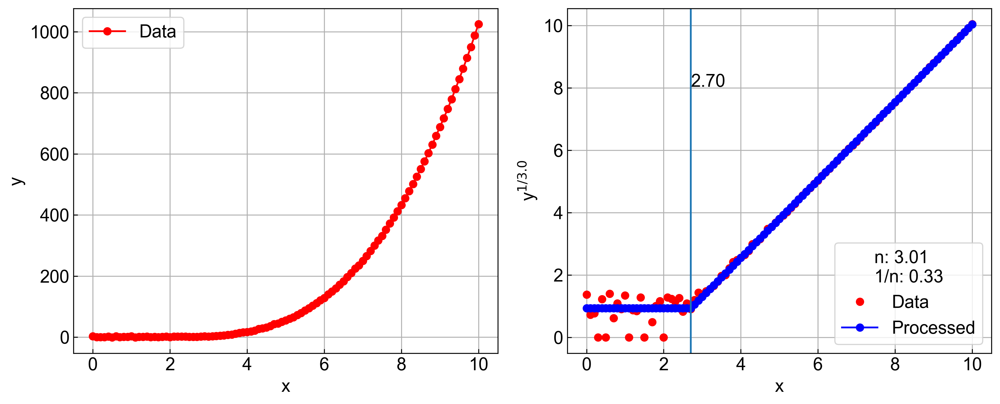

Margin: 0.5, shift: 2.00, power: 3.01
R2: 1.00, ER: 0.20


In [10]:
# ノイズあり
xx = np.arange(0,10.1,0.1)
np.random.seed(seed=1)
p =  (2,2,3,1)
yy = simf.power_plus(xx,*p) + np.random.normal(loc=0.0, scale=1, size=len(xx))

search_range = powfit.create_serach_range(2, 0.5, 0.1)

# for im in [0,0.1,0.3,0.5,1.0,1.5]:
for im in [0.5,]:
    temp = powfit.PfAnalysis(xx,yy)
    # print('Constant Power')
    # temp.shift_estimate_by_power_scan(search_range=None,
    #                                 info=False, 
    #                                 plot=True)
    # print('Constant Shift')
    temp.power_estimate_by_shift_scan(search_range=search_range, 
                                        fit_type='mae', 
                                        # fit_type='weight',
                                        bg_num=10,
                                        lim_val=im,
                                        min_error='mae',
                                        info=False,
                                        plot=True,
                                        plot_fig_step=2)
        
        # print(f'Const Power: shift: {temp.shebypw["shift"]:.2f}, power: {temp.shebypw["power"]:.2f}')
    # print(f'Const Shift: shift: {temp.pwebysh["shift"]:.2f}, power: {temp.pwebysh["power"]:.2f}')
    print(f'Margin: {im}, shift: {temp.pwebysh["shift"]:.2f}, power: {temp.pwebysh["power"]:.2f}')
    print(f'R2: {temp.pwebysh["r2"]:.2f}, ER: {temp.pwebysh["er"]:.2f}')